In [1]:
from transformers import AutoProcessor, Blip2ForConditionalGeneration, BitsAndBytesConfig, Blip2Config
from PIL import Image
import torch
import matplotlib.pyplot as plt
import os 

In [2]:
OS_environ = os.environ
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
device = "cuda" if torch.cuda.is_available() else "cpu"
quant_config = BitsAndBytesConfig(load_in_8bit=True)
config = Blip2Config.from_pretrained("Salesforce/blip2-opt-2.7b")
processor = AutoProcessor.from_pretrained("Salesforce/blip2-opt-2.7b")

# The Model can be found at https://huggingface.co/luisdomene4/BLIP2-Finetune-Recipes

model_finetuned = Blip2ForConditionalGeneration.from_pretrained(
    "paht/to/the/model",
    device_map="auto",
    quantization_config=quant_config
)




Loading checkpoint shards:   0%|          | 0/8 [00:00<?, ?it/s]

Expanding inputs for image tokens in BLIP-2 should be done in processing. Please follow instruction here (https://gist.github.com/zucchini-nlp/e9f20b054fa322f84ac9311d9ab67042) to update your BLIP-2 model. Using processors without these attributes in the config is deprecated and will throw an error in v4.50.


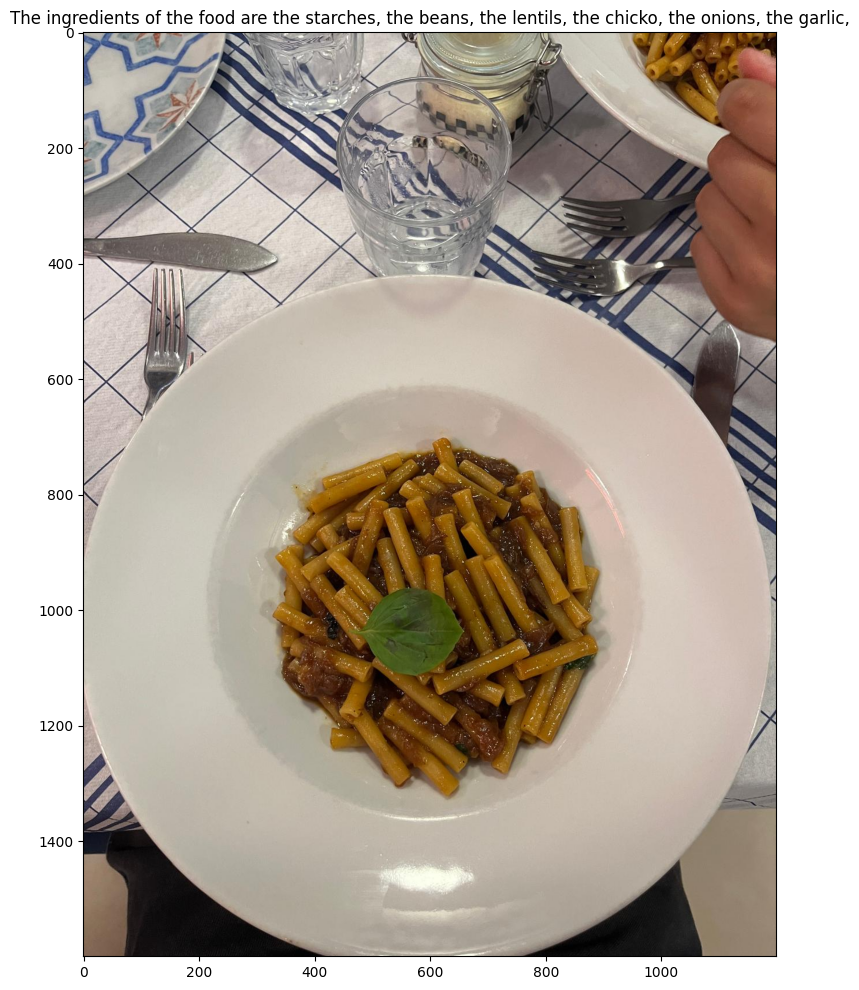

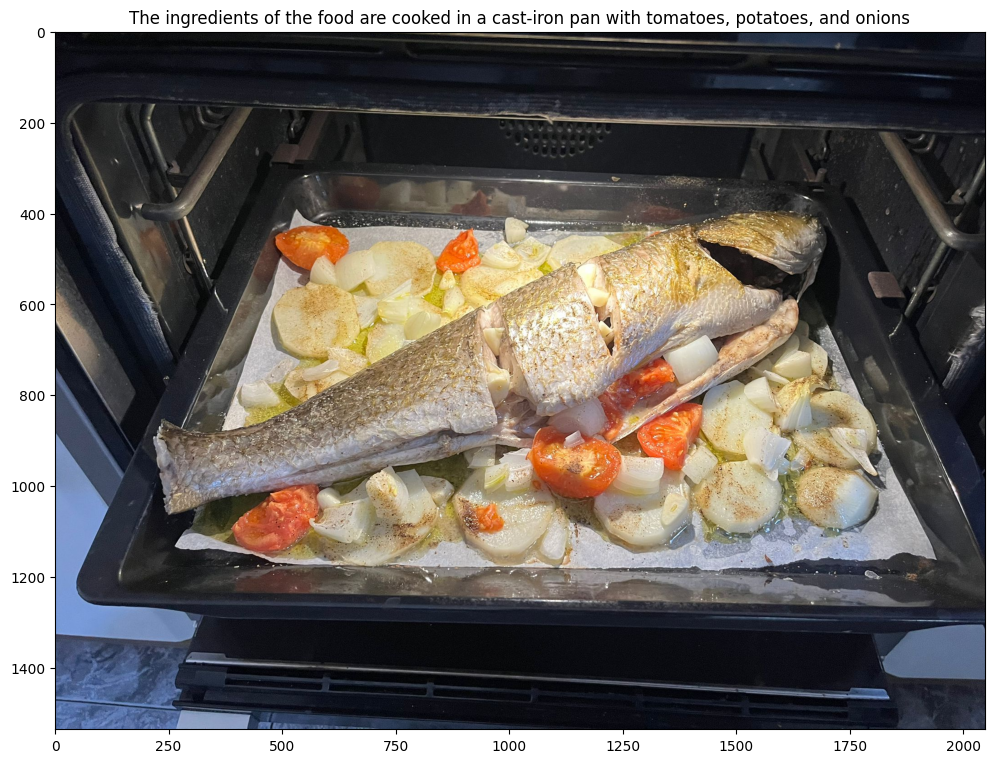

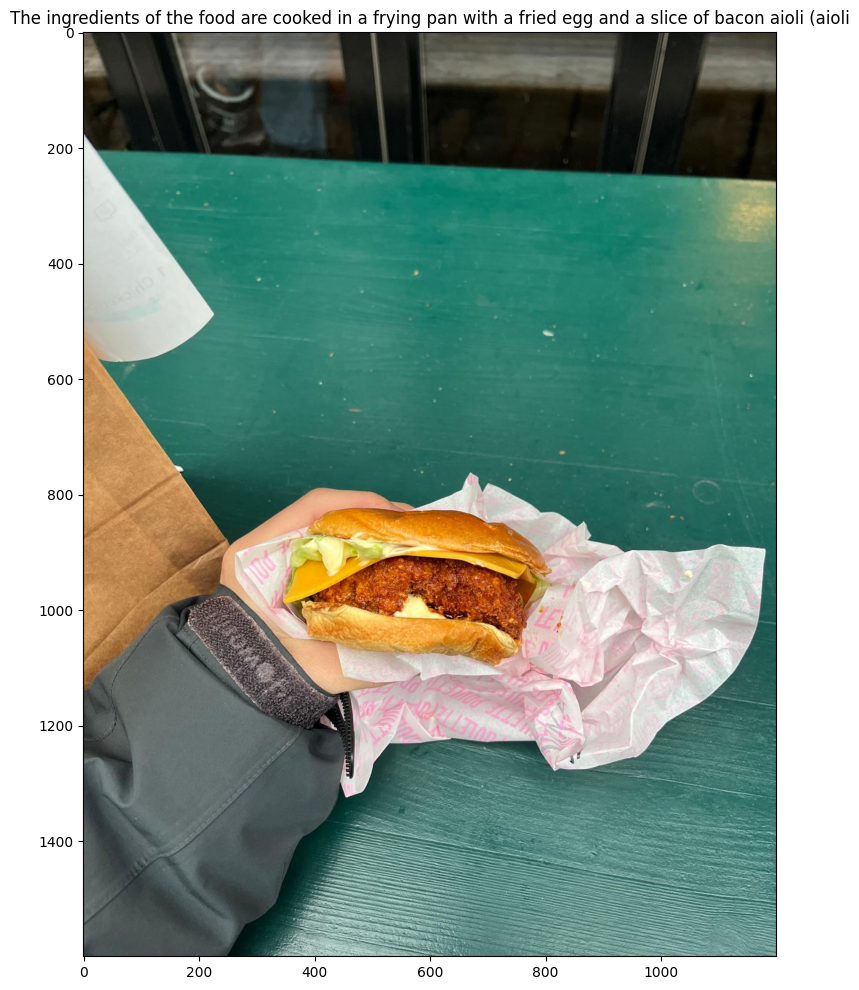

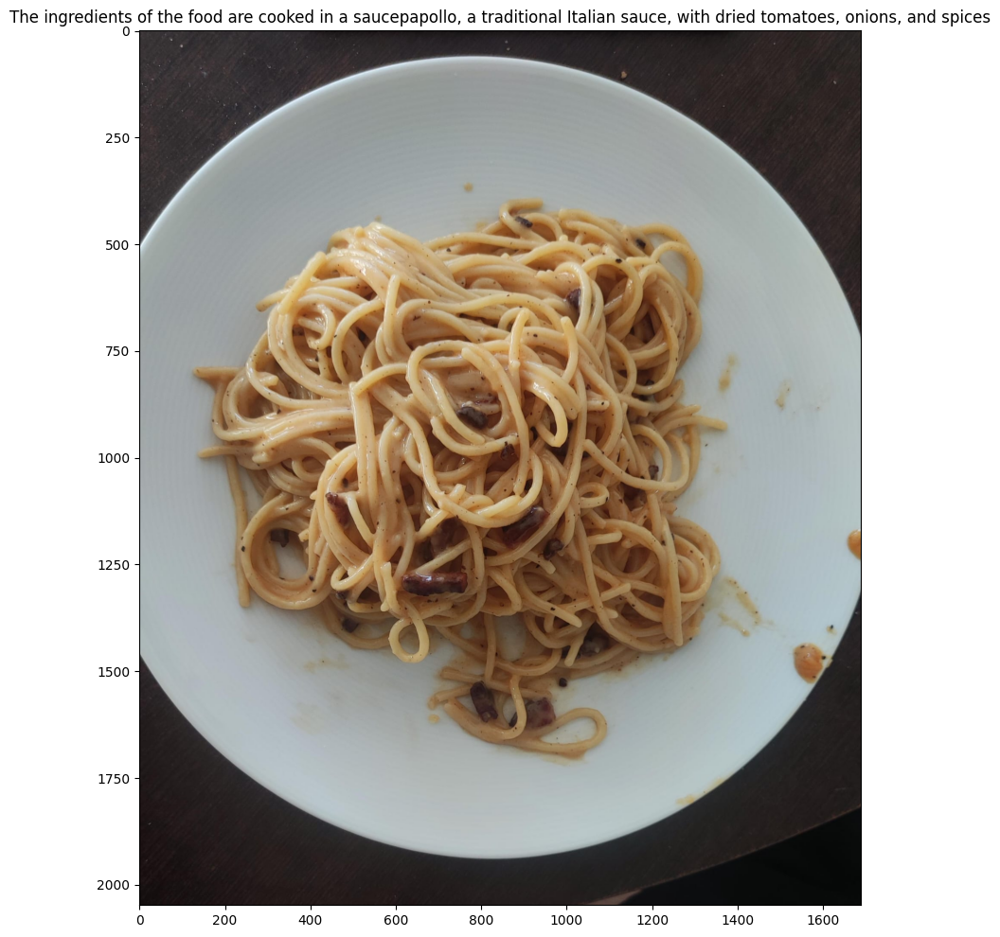

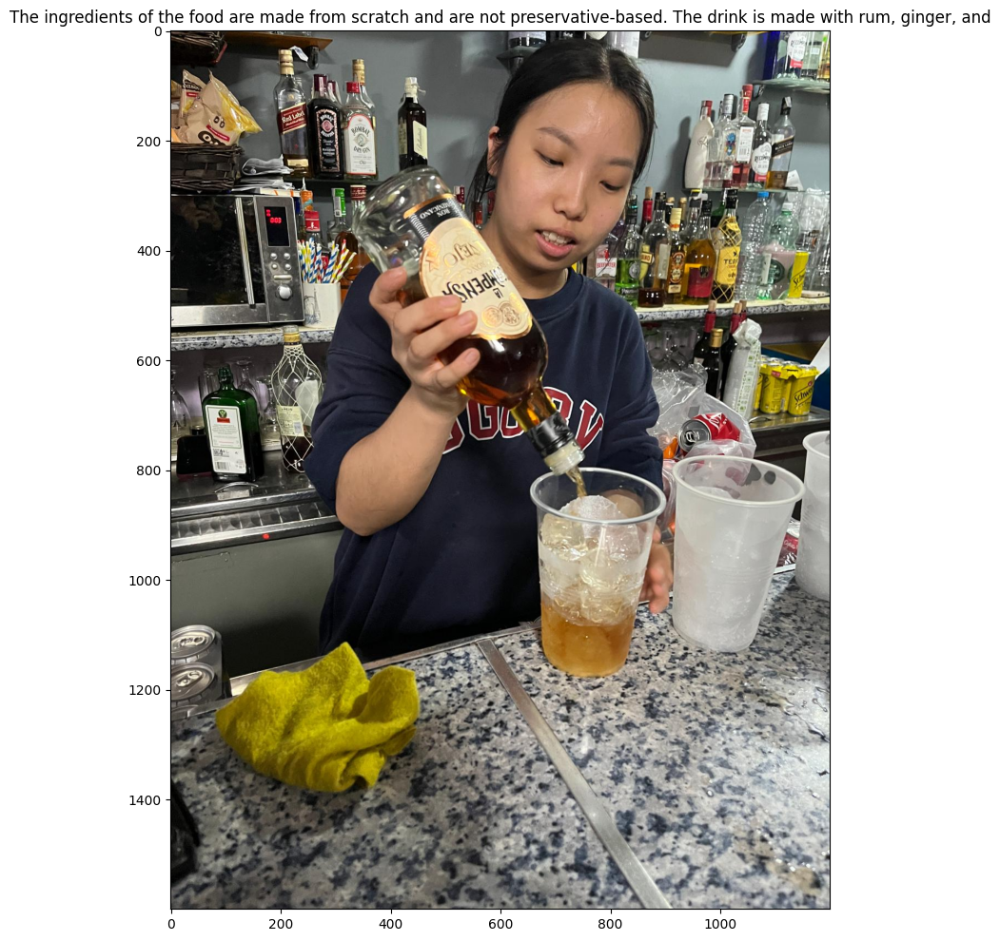

In [3]:
def read_images(path_directory):
    for file in os.listdir(path_directory): 
        if file.endswith(".jpg"):
            path = os.path.join(path_directory, file)
            caption = get_caption(path)
            plt.figure(figsize=(12, 12))
            plt.title(caption)  
            plt.imshow(Image.open(os.path.join(path_directory, file)))
            plt.show()
            plt.close()

def get_caption(img_path):
   

    image = Image.open(img_path).convert("RGB")
    inputs = processor(images=image,text="The ingredients of the food are", return_tensors="pt").to(device, torch.float16)
    
    pixel_values = inputs['pixel_values']
    input_ids = inputs["input_ids"]
    attention_mask = inputs["attention_mask"]
    generated_ids = model_finetuned.generate(input_ids= input_ids, pixel_values=pixel_values, attention_mask=attention_mask, max_length=100)
    generated_caption = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return generated_caption

read_images("/home/ldomene/CAP-GIA/test_real/")

torch.Size([1, 3, 224, 224])


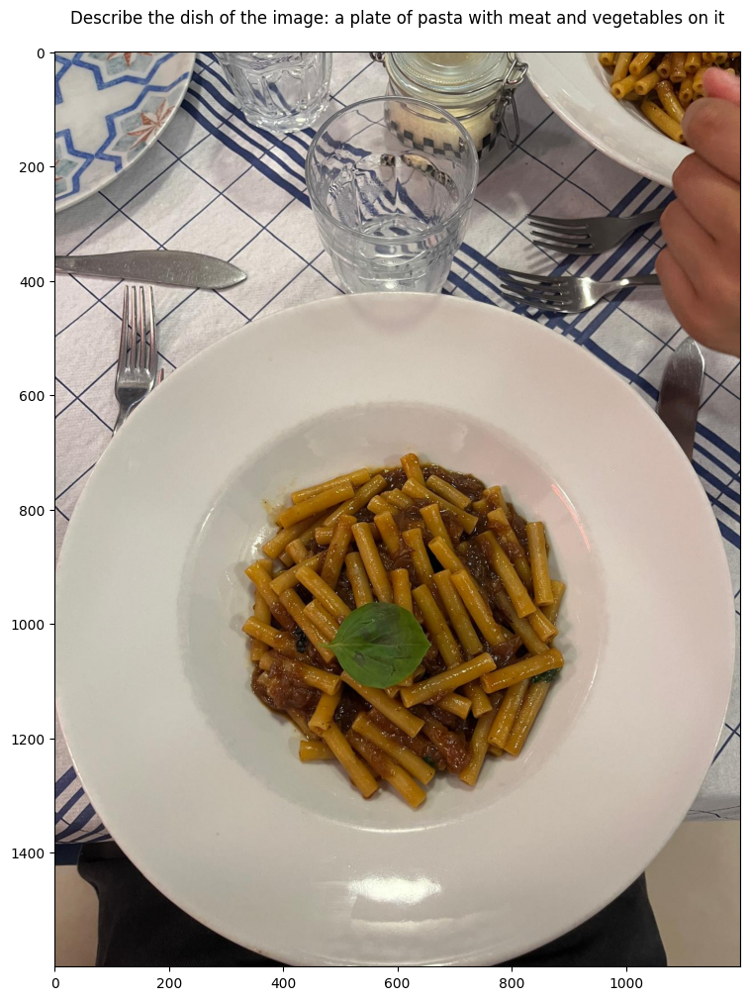

torch.Size([1, 3, 224, 224])


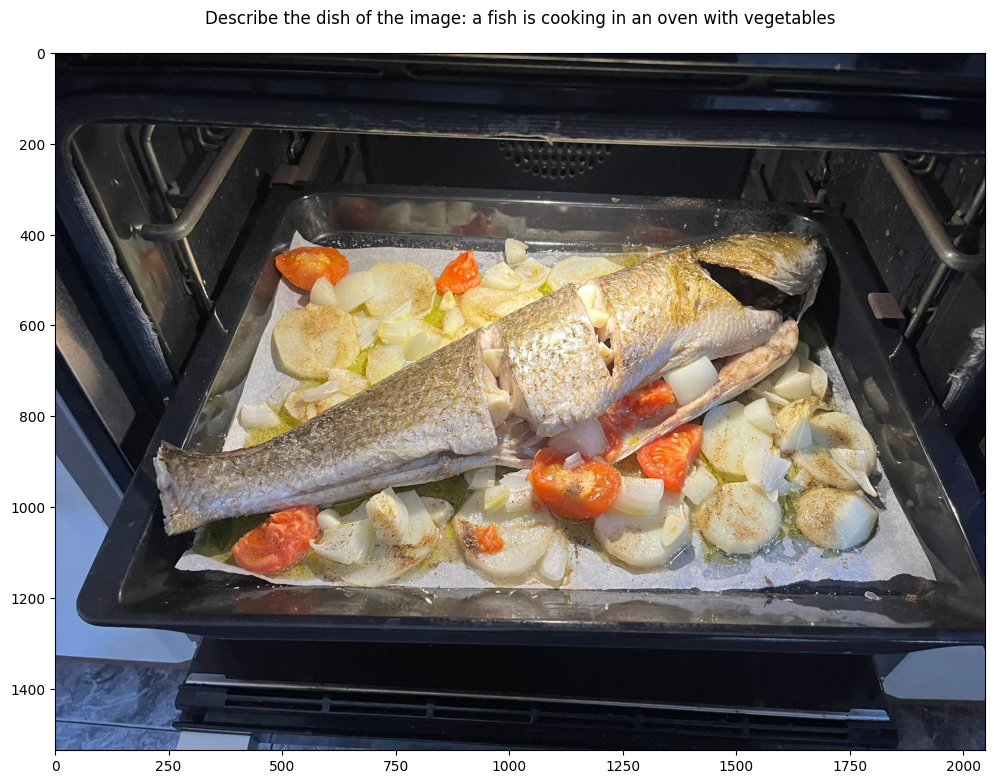

torch.Size([1, 3, 224, 224])


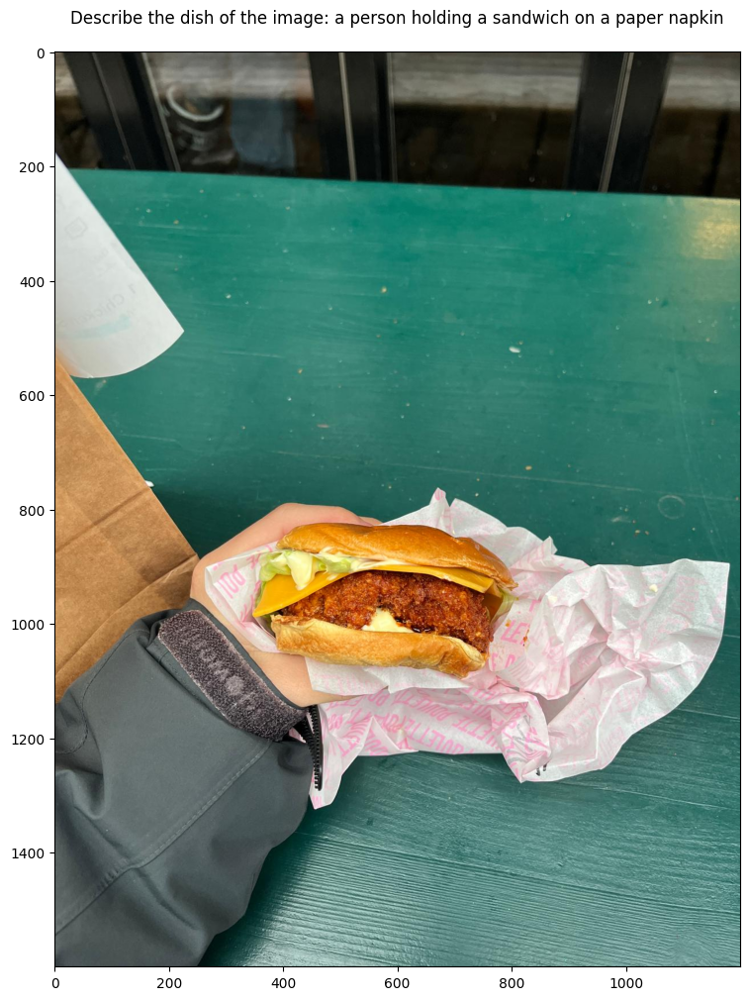

torch.Size([1, 3, 224, 224])


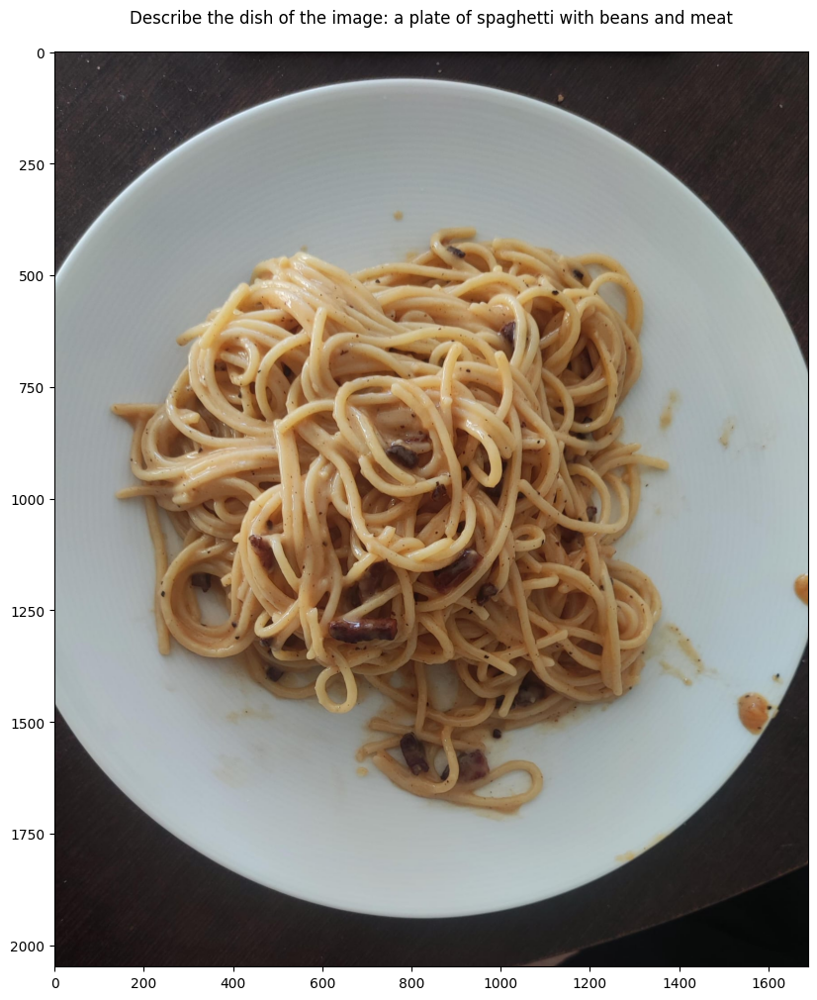

torch.Size([1, 3, 224, 224])


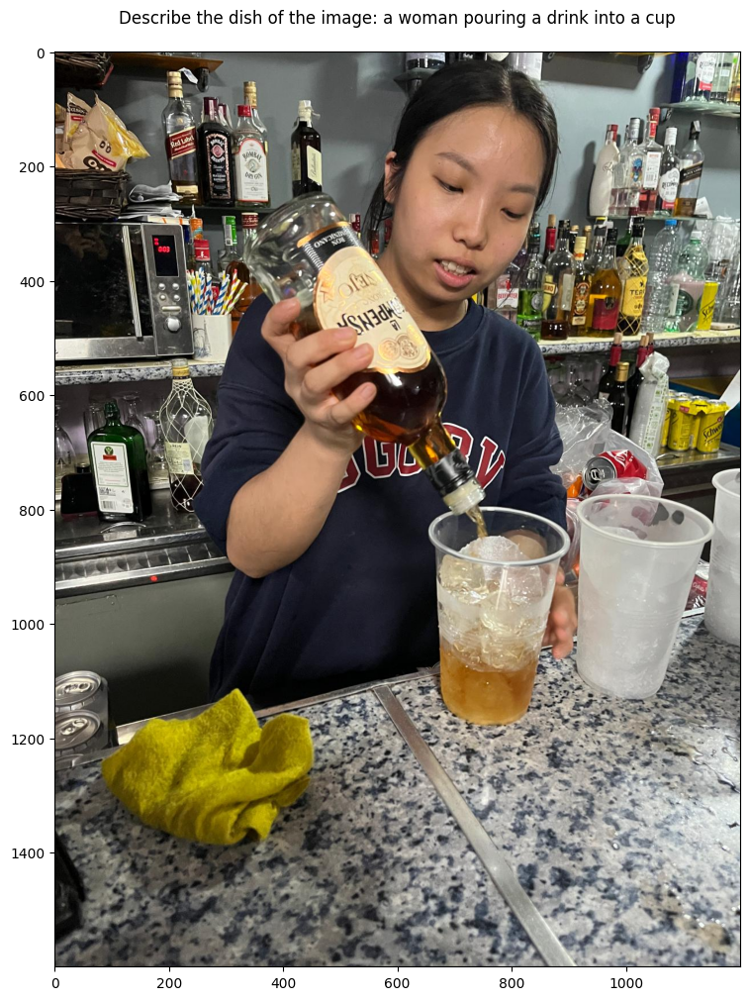

In [23]:
def read_images(path_directory):
    for file in os.listdir(path_directory): 
        if file.endswith(".jpg"):
            path = os.path.join(path_directory, file)
            caption = get_caption(path)
            plt.figure(figsize=(12, 12))
            plt.title(f"Describe the dish of the image: {caption}")
            plt.imshow(Image.open(os.path.join(path_directory, file)))
            plt.show()
            plt.close()

def get_caption(img_path):
   

    image = Image.open(img_path).convert("RGB")
    inputs = processor(images=image, return_tensors="pt").to(device, torch.float16)
    
    print(inputs.pixel_values.shape)
    pixel_values = inputs.pixel_values
    generated_ids = model_finetuned.generate(pixel_values=pixel_values, max_length=50)
    generated_caption = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return generated_caption

read_images("/home/ldomene/CAP-GIA/test_real/")